# Real-Time Neural Spike Detection

Neuralink, US 2020/041372, Filed 9/9/2020, Published 1/21/2021

Notebook written by Michael Zhou (mgz2112@columbia.edu)

## Background

- **Key information** of neural activity can be identified based on neuron spikes - action potential in neuron
- **Spikes** - characteristic rises in voltage across plasma membrane in cell, caused by depolarization + repolarization in membrane
- **Existing methods** include **total voltage exceeding some threshold** (produces **lots of false positives**) and **machine learning** techniques (**expensive, very power-consuming**). 


## Goal

This notebook provides an implementation of the **neural spike detection algorithm** described in US patent application number **US 2020/041372** from **Neuralink**, titled **"Real-Time Neural Spike Compression"**. 

## What is a spike? 

A neuron spike is a neural signal with **characteristic rises and falls**, characterized by the following:

- Start out with <font color='blue'>**initial resting value**</font>
- <font color='green'>**First positive change**</font> in amplitude
- <font color='red'>**Reduction**</font> in amplitude below initial resting value
- <font color='darkgreen'>**Second positive change**</font> in amplitude greater than first positive change

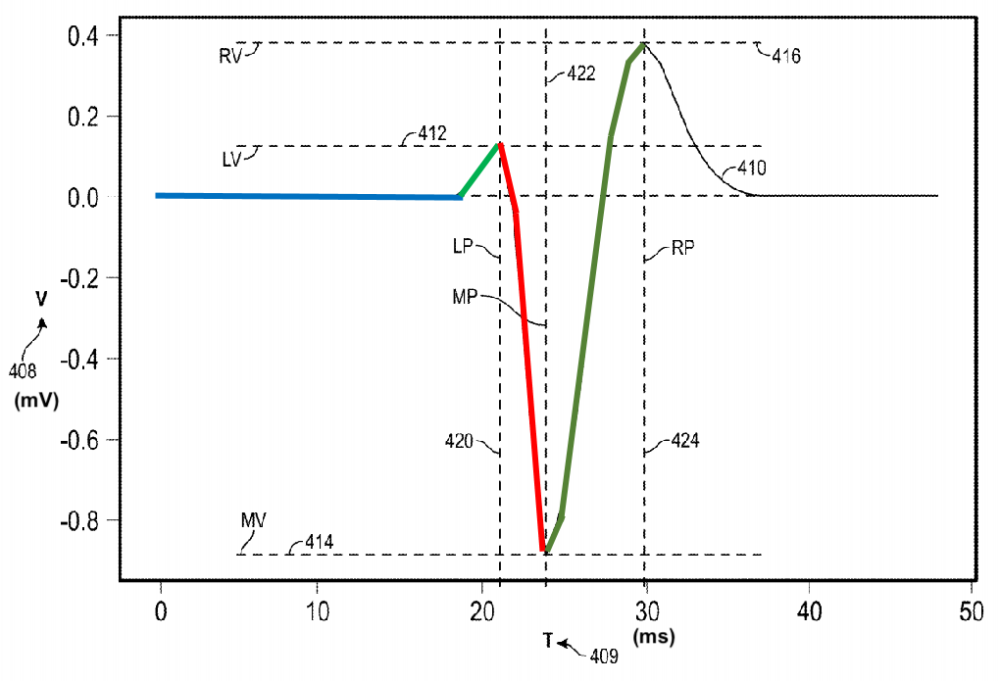

## Note: The following steps are actually implemented in hardware

Since this implementation involves using **fixed-point** arithmetic, **in practice**, the following steps shown in this patent is **implemented mostly in hardware**. We are just simply displaying these steps in the notebook for educational purposes.  

## Overall Flowchart

**Note**: May be performed in **some different order** or in **parallel**!

![alt text](Flowchart.png)

## 1. Receive Biological Signal

Receive neurological voltage signal from electrode leads to IC chip

Sample a custom biological signal (pretend that this is received)

Params: 
- Sampling frequency ($f_{s}$ = 20000 samples per second, or 800 samples per window)
- Period ($T$ = 2 seconds)
- Window (blackout period = 40 ms)

In [363]:
import numpy as np
import scipy
from scipy.signal import find_peaks, argrelextrema, butter, filtfilt, sosfiltfilt, sosfilt, bode, freqz, freqs, sosfreqz, iirfilter
from scipy.fftpack import fft
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import control as ct
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from scipy.optimize import curve_fit
import heapq

In [364]:
fs = 20000 # sampling frequency (samples per second)
T = 2 # period of interest (seconds)
blackout_period = 0.04 # 40 ms window
t = np.arange(0, T, 1 / fs) 

In [365]:
# Converts time t (in seconds) to index in data
def time_to_index(t):
    return int(t * fs)

In [366]:
# Set very small random noise in the range [-epsilon, epsilon]
def small_random_noise(epsilon = 0.05):
    return np.random.uniform(-epsilon, epsilon, size=len(t))

In [367]:
def sample_spikes(x, n_spikes, epsilon = 0.05):
    offset = 4
    
    sampled_spike_indices = np.random.choice(np.arange(offset, len(t)), size=n_spikes, replace=False)
    sampled_spike_indices.sort()
    
    for index in sampled_spike_indices:
        assert(index >= offset)
        x[index - np.random.randint(1, offset)] = np.random.uniform(-epsilon * 6, -epsilon * 4)
        x[index] = np.random.uniform(epsilon * 8, epsilon * 12)
    
    return sampled_spike_indices

In [368]:
# Sample a signal
data = small_random_noise(epsilon=0.05)

# Sample spikes at random timestamps
n_spikes = 8
sampled_spike_indices = sample_spikes(data, n_spikes=n_spikes, epsilon=0.05)

# Ground truth
print('spikes sampled at (s):', t[sampled_spike_indices])

spikes sampled at (s): [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]


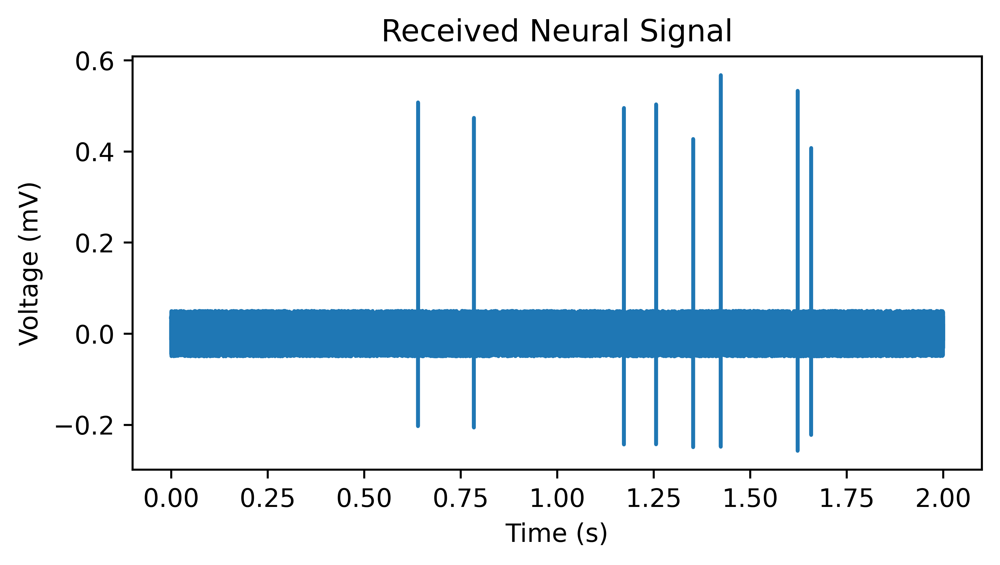

In [369]:
# Plot the received (sampled) signal
fig, ax = plt.subplots(1, 1, figsize=(6, 3),dpi = 600)

plt.title("Received Neural Signal")
plt.ylabel("Voltage (mV)")
plt.xlabel("Time (s)")

plt.plot(t, data)
plt.show()

## 2. Filter Signal (preprocessing)

**Filter** - **subset** of signal is **retained**

Preprocessing signal - use **classical control theory** 

e.g., 
- **High-pass filter** - select portions of signal that **exceed** some **threshold voltage**
- **Bandpass filter** - select portions of signal in **configured voltage band**
- **Butterworth filter** - type of **bandpass filter** that **selects voltage window**


Here, we use a **bandpass filter**: a **16-bit digital Infinite Impulse Response (IIR) Butterworth 2nd-Order Bandpass Filter**
![alt text](Fig9.png)

The equations are as following: 

$y = x * b_{0} + w_{1}$

$w_{1} = w_{2} + x * b_{1} - y * a_{1}$

$w_{2} = x * b_{2} - y * a_{2}$

where $x$ - sample for a channel, $y$ - output of filter,

$a_{1}$, $a_{2}$, $b_{0}$, $b_{1}$, $b_{2}$ - configurable params by user

$w_{1}$, $w_{2}$ - internal states (16 bits each)

### Finite Impulse Response (FIR) vs Infinite Impulse Response (IIR)

**FIR**: 
- **No feed-back** structure (**only feed-forward**)
- Used in **engineering**
- **Easy to implement** due to **high precision** 

**IIR**: 
- Includes **feed-back** structure (**loops**)
- Used in **theoretical research**
- **Very difficult to implement** in **hardware** due to loops (mostly used in **software**)


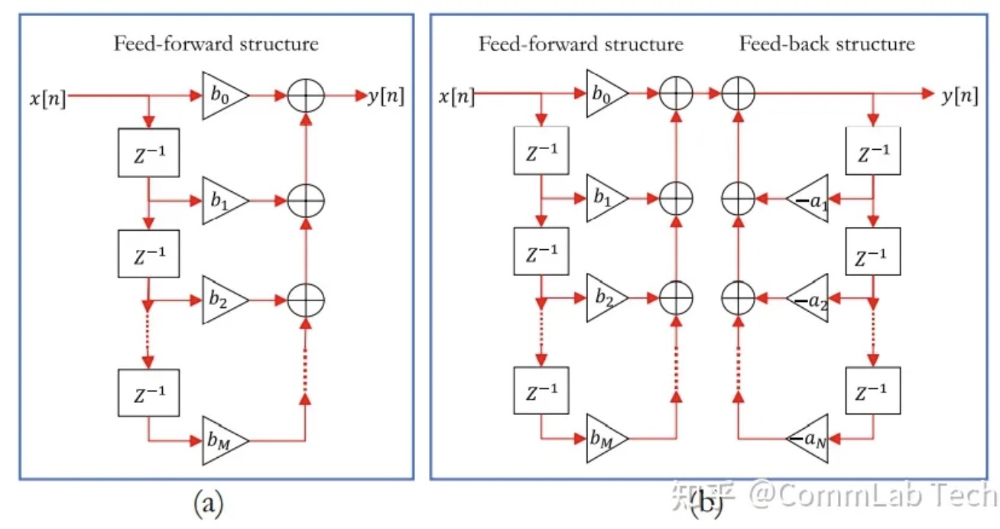

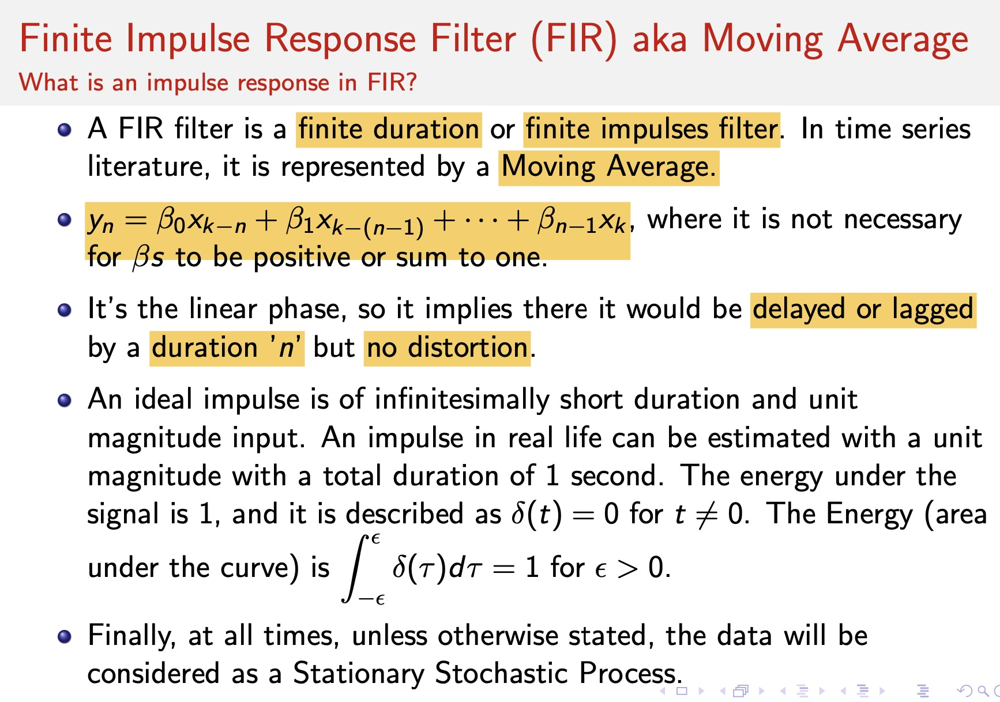

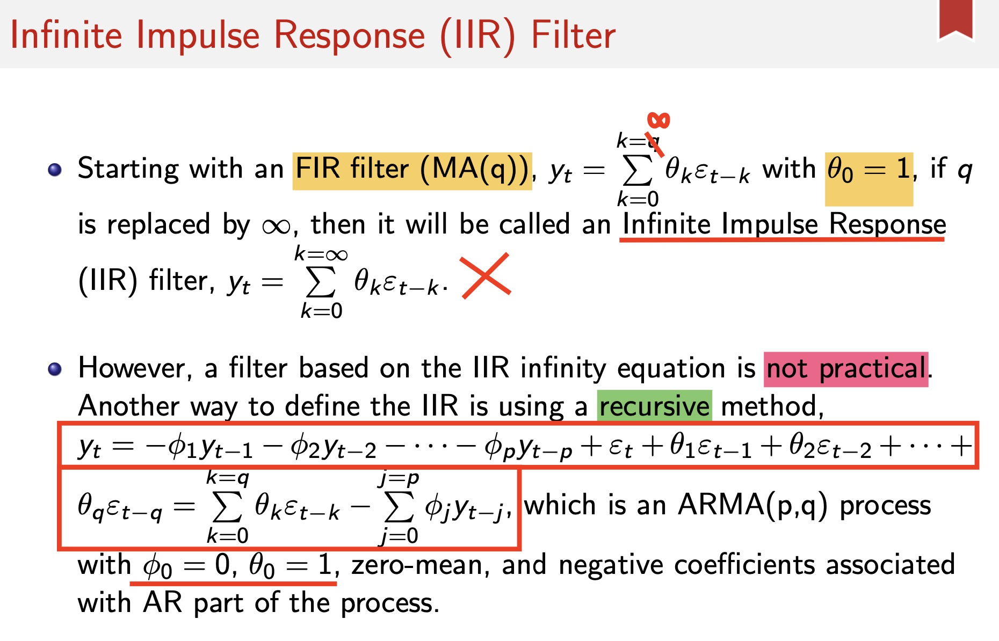

$\theta$: $b$, $\phi$: $a$, $\epsilon$: $x$ (we are not modeling random Gaussian noise, but taking the original signal input and filtering it)

Since we are using a Python Jupyter notebook, an **IIR structure is okay**. 

### Filter implementation (using same params as mentioned in patent)

Implement the above IIR structure with exact same param values mentioned in patent

In [370]:
# Assumes b, a are non-empty!
def iir_impl(b, a, x):
    # Output of filter
    y = []
    
    # Internal states
    w = np.zeros(len(b) + 1) # w: pad a zero on each end (for code readability)
    
    y_val = 0
    
    for i in np.arange(0, len(x)):
        y_val = w[1] + x[i] * b[0] - y_val * a[0]
        
        for j in np.arange(1, len(b)):
            w[j] = w[j + 1] + x[i] * b[j] - y_val * a[j] 
        
        y.append(y_val)
    
    y = np.array(y)
    return y

In [371]:
# Configurable params by user (copied from Fig. 9 above)
# These params are used in a transfer function H(z) (described further below)
b0 = 0.487305044246353
b1 = 0
b2 = -b0
a0 = 0
a1 = -0.846977922376899
a2 = 0.025389911507294

# Coeffs b, a for H(s)
b = np.array([b0, b1, b2])  # coeffs for numerator
a = np.array([a0, a1, a2])  # coeffs for denominator

# Sample for each channel
x = data 

# Output of IIR filter
y = iir_impl(b, a, x)

Usually, when filtering, we follow this procedure: 
1. Plot the **original signal** 
2. Plot **Fast-Fourier Transform (FFT) of original signal** to get the **configured voltage window (low and high cut frequencies)**, indicated by the **principal components**. 
3. **Filter the original signal** with the **configured frequency band** and plot it
4. Plot the **FFT of filtered signal** to see if the interested PCs are kept.  

![alt text](FFT.png)

Steps 1 & 2: Original Signal + its FFT 

In [372]:
# Steps 1 & 2
fig, ax = plt.subplots(2, 1, figsize=(30, 30), dpi = 600)
plt.subplots_adjust(hspace=0.4)

# Step 1: Plot original signal
ax[0].plot(t, x)
ax[0].set_title("Original Signal")
ax[0].set_xlabel("Time (s)")
ax[0].set_ylabel("Voltage (mV)")

# Step 2: Plot FFT of original signal
fft1 = fft(x)
ax[1].plot(t * fs * fs / len(x), fft1)
ax[1].set_title("FFT on Original Signal")
ax[1].set_xlabel("Frequency (Hz)")
ax[1].set_ylabel("Coefficient")
ax[1].set_xlim(0, fs / 2)

plt.show()

/Users/michaelzhou/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1289: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Because of a high sampling frequency, it is very difficult to find the particular principal component frequencies that stick out. But for lower sampling frequencies, it is much easier to see them. 

Steps 3 & 4: Filtered Signal + its FFT 

In [373]:
# Steps 3 & 4
fig, ax = plt.subplots(2, 1, figsize=(30, 30), dpi = 600)
plt.subplots_adjust(hspace=0.4)

# Step 3: Plot filtered signal
ax[0].plot(t, y)
ax[0].set_title("Filtered Signal")
ax[0].set_xlabel("Time (s)")
ax[0].set_ylabel("Voltage (mV)")

# Step 4: Plot FFT of filtered signal
fft2 = fft(y)
ax[1].plot(t * fs * fs / len(data), fft2)
ax[1].set_title("FFT on Filtered Signal")
ax[1].set_xlabel("Frequency (Hz)")
ax[1].set_ylabel("Coefficient")
ax[1].set_xlim(0, fs / 2)

plt.show()

/Users/michaelzhou/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1289: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


We can see a clear picture of the locations of the spikes after filtering the signal. But **practically**, you **do NOT want to hard-code hyperparams manually**. But since this algorithm is implemented in hardware, and the patent has given these hyperparameters, we are only using this notebook for **education purposes only**. 

### Plot the Bode graph of the above filter (using the b, a params)

After filtering the signal, we usually draw a **Bode plot**. A **Bode plot** is a semi-logarithmic coordinate plot of the **transfer function** of a non time-varying time system with respect to frequency, with the **horizontal x axis** representing a **log-frequency scale**. It includes 2 plots, one **amplitude vs frequency** (dB of frequency response gain vs frequency variation) and one **phase vs frequency** (phase of frequency response vs frequency variation).

In order to draw a Bode plot, we need to figure out the **transfer function** $H(s)$, which includes a set of coefficients $b$ in the numerator and another set of coefficients $a$ in the denominator. 

The **transfer function formula** is given as: 

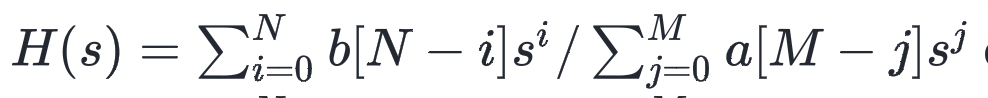

where $b = {b_{0}, b_{1}, ..., b_{N}}$ and $a = {a_{0}, a_{1}, ..., a_{M}}$

In [374]:
# Print b & a params
print('b:', b)
print('a:', a)

# Write the transfer function H(s) here using the coeffs
ct.tf(b, a)

b: [ 0.48730504  0.         -0.48730504]
a: [ 0.         -0.84697792  0.02538991]


TransferFunction(array([ 0.48730504,  0.        , -0.48730504]), array([-0.84697792,  0.02538991]))

<ipython-input-375-e1aaf5ae9f37>:5: RuntimeWarning: divide by zero encountered in log10
  magnitude = 20*np.log10(np.abs(h))


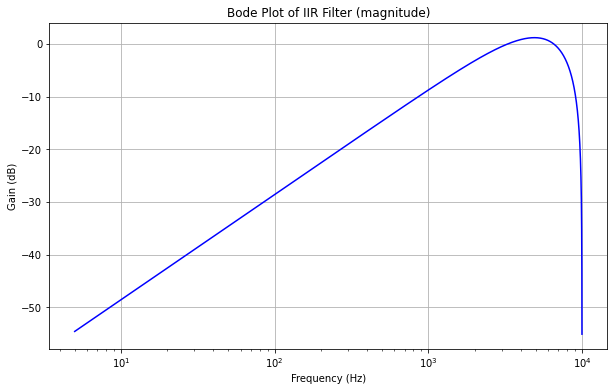

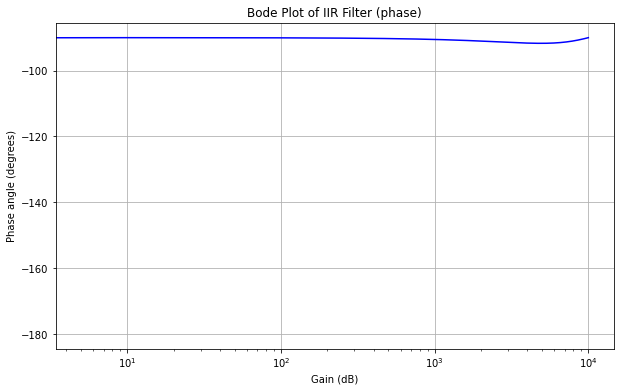

In [375]:
# Plot Bode graph here
w, h = freqz(b, a, worN=2000) # obtain w - angular frequency, h - transfer function values

# Calculate magnitude + phase graphs
magnitude = 20*np.log10(np.abs(h))
phase = np.unwrap(np.arctan2(np.imag(h), np.real(h)))*(180/np.pi)

# Bode plot (magnitude)
plt.figure(figsize=(10,6))
plt.semilogx(w*fs/(2*np.pi), magnitude, 'b-')
plt.title('Bode Plot of IIR Filter (magnitude)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain (dB)')
plt.grid()
# plt.xlim(1, 10000)

# Bode plot (phase)
plt.figure(figsize=(10,6))
plt.semilogx(w*fs/(2*np.pi), phase, 'b-')
plt.title('Bode Plot of IIR Filter (phase)')
plt.xlabel('Gain (dB)')
plt.ylabel('Phase angle (degrees)')
plt.grid()

plt.show()

In [376]:
# Compute the high and low cuts of the frequency
frequency_band = w[magnitude >= -3] * fs/(2*np.pi) # Frequencies where gain >= -3 -> keep signals for band-pass 
low_cut = frequency_band[0]
high_cut = frequency_band[-1]
print('configured frequency band: [', low_cut, ',', high_cut, '] Hz')

configured frequency band: [ 2055.0 , 7830.0 ] Hz


As we see in the Bode magnitude plot, we see that the **configured frequency range** is **about [2055, 7830] Hz**. According to the patent, this range is about **3000 - 4000 Hz**, where spikes are detected. But the above band range is close enough. 

Usually, the **params** (the **transfer function coefficients $b = [b_{0}, b_{1}, ..., b_{N}]$, $a = [a_{0}, a_{1}, ..., a_{M}]$**) are ***generated by the filter*** rather than manually hard-coded. We are showing this just for demonstration.  

**About Bode Plots**:

- The **Bode plot** has **NOTHING to do** with the **filtered signal $y$**, since it **only depends on the transfer function $H(z)$ (with coefficients $b$ and $a$)!!!** So you CAN plot the Bode graph BEFORE filtering the signal!!


- Most of the time, we **only need** look at the **magnitude plot**. But occassionally, when the **filtered signal is faulty** (e.g., when the signal is **diverging**), we would also look at the **phase plot** and look at whether conditions dictate a [**self-excitation oscillation**](https://baike.baidu.com/item/自激振荡/3732042?fr=ge_ala) (i.e., whether the signal at the end is *still* at a **certain amplitude and frequency** **without** adding any **outside input signals**).


- For the **phase plot**, normally, we would need to check whether our **phase range** is good enough for our **chosen frequency range**. This is **dependent on the application**. 

## 3. Smoothing 

- Apply **local smoothing function** (**Brown's double exponential smoothing function**)

**Smoothing** - **Remove** any **system noise** from the data, using **modern control theory**

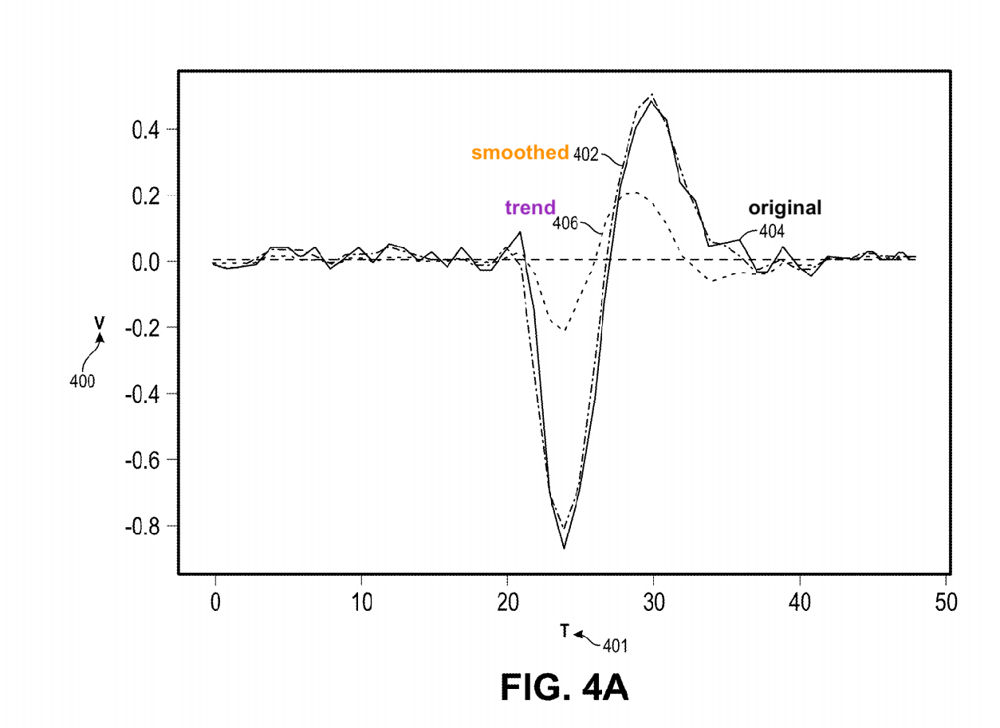

### Exponential Smoothing: 

For our smoothing method, we choose **exponential smoothing (ES)**, since it captures **non-linear patterns** (such as **neural spikes**) using an **exponentially decreasing function**, unlike other smoothing methods (moving average, kernel smoothing, etc.).  

In ES, **no sliding window** is used, and **more recent data points** are given a **greater weight** than the ones further in the past. 

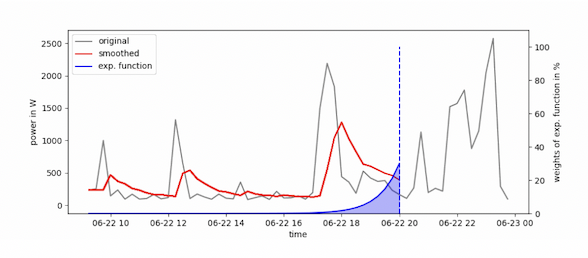

The formula for (simple) exponential smoothing is given below:

For $t > 0$: $\hat{y}_{t} = \alpha * y_{t} + (1 - \alpha) * \hat{y}_{t-1}$ 

For $t = 0$: $\hat{y}_{0} = y_{0}$

where $\alpha$ is the smoothing factor (**bigger $\alpha$** -- **smaller emphasis** on **past data points**, **smaller smoothing**) 

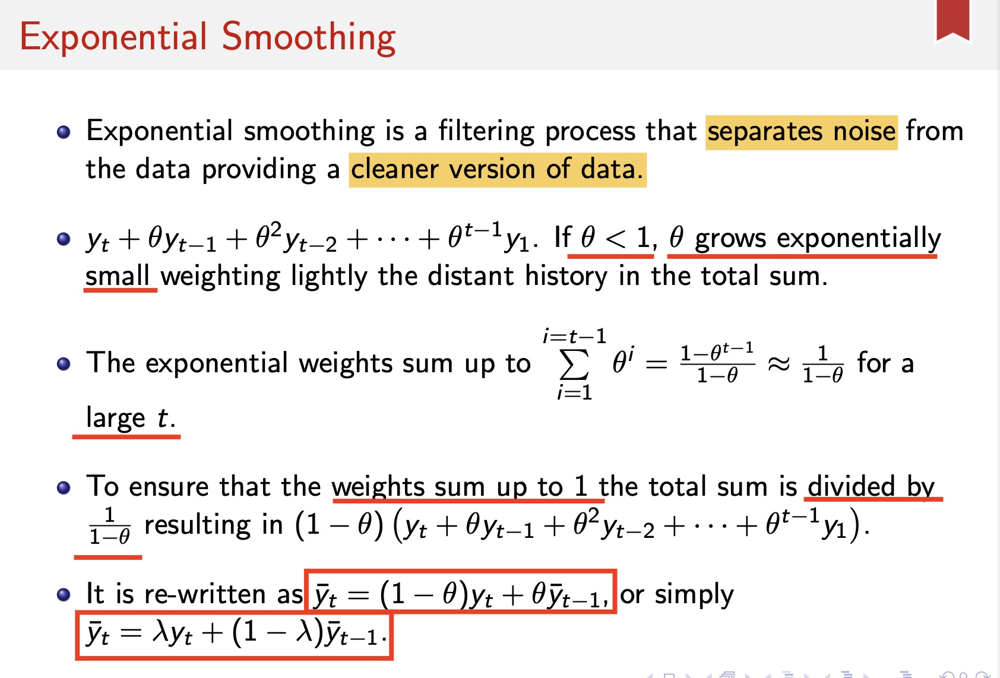

### Double Exponential Smoothing

In double exponential smoothing, we have a **level** (**current estimate** of series' underlying level or **average**; **smoothed value** at currrent time point)** and the **trend** (how data is **progressing**). 

Normally, we **two (2)** hyperparameters: $\alpha$ and $\beta$, which controls the level and the trend respectively. The **trend** can be **additive (linear trend)** or **multiplicative (exponential trend)**. We must identify whether the trend is linear or exponential. 

The most common double exponential smoothing method is **Holt's Double ES**, which uses an **additive (linear) trend**, and is represented by: 

$\hat{y}_{t} = l_{t} + r_{t}$

$l_{t} = \begin{cases} y_{t} & \text{if } t = 0 \\ \alpha y_{t} + (1 - \alpha) (l_{t - 1} + r_{t - 1}) & \text{otherwise} \end{cases}$

$r_{t} = \begin{cases} y_{t-1} - y_{t} & \text{if } t = 0 \\ \beta (l_{t} - l_{t - 1})+ (1 - \beta) r_{t - 1}) & \text{otherwise} \end{cases}$

where $l$ is the level and $r$ is the trend.

### Brown's Double Exponential Smoothing 

In this patent, we use **Brown's double ES**, since we can find both the **level** AND the **trend** using only **one (1) hyperparameter ($\alpha$)**, instead of two (in Holt). Note that our spikes are **randomly sampled**, and can happen at **ANY** time, so there is **no seasonality involved**. 

The formula is expressed as the following:

Single exponential smoothing: $S'(t) = \alpha Y(t) + (1 - \alpha)S'(t-1)$ 

Double exponential smoothing: $S''(t) = \alpha S'(t) + (1 - \alpha)S''(t-1)$ 

Forecast: $\hat{Y}(t+1) = a(t) + b(t)$ 

where $a(t) = 2S'(t)-S''(t)$ (estimated level at time t)

$b(t) = \frac{\alpha}{1 - \alpha} (S'(t) - S''(t))$ (estimated trend at time t)

In [377]:
def brown_double_es(y, alpha=0.1):
    
    single = np.zeros(y.shape)
    double = np.zeros(y.shape)
    
    level = np.zeros(y.shape)
    trend = np.zeros(y.shape)
    
    y_hat = np.zeros(len(y) + 1)
    
    for i in np.arange(0, len(x) - 1):
        single[i] = alpha * y[i] + (1 - alpha) * single[i - 1]
        double[i] = alpha * single[i] + (1 - alpha) * double[i - 1]
        
        level[i] = 2 * single[i] - double[i]
        trend[i] = (1 / (1 - alpha)) * (single[i] - double[i])
        
        y_hat[i + 1] = level[i] + trend[i]
    
    return np.array(y_hat[:len(y_hat) - 1]), np.array(trend)

In [378]:
# Perform smoothing
forecast, trend = brown_double_es(y, alpha=0.1) # Choose between {0.1, 0.2, ..., 0.9} with smallest MSE
mean_squared_error(forecast, y)

0.000562206417499296

<Figure size 432x288 with 0 Axes>

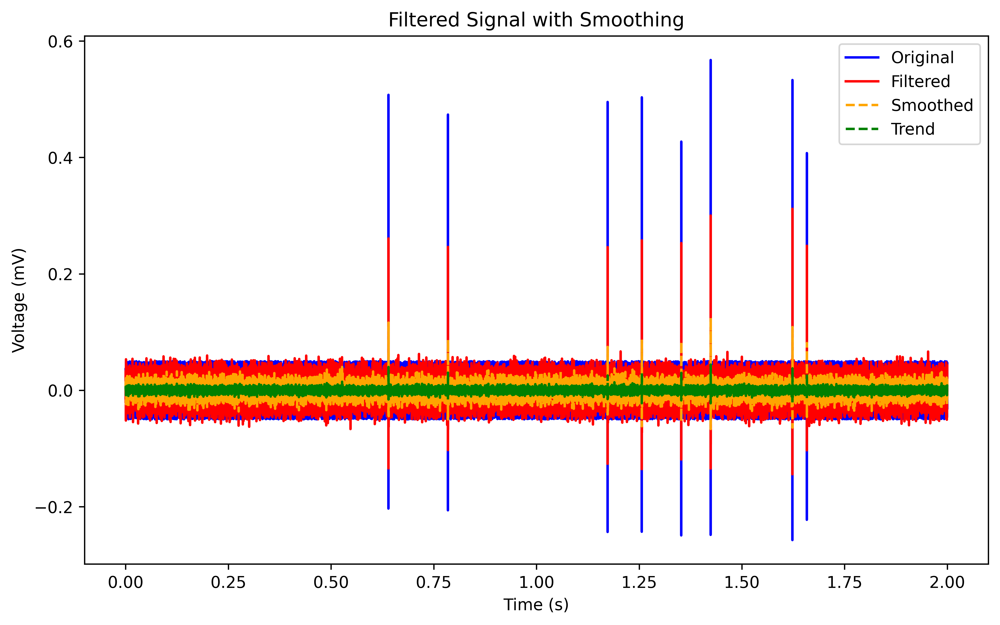

In [379]:
plt.figure()
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 600)
plt.subplots_adjust(hspace=0.4)

# Plot signal + smoothed signal
plt.plot(t, x, color='blue', linestyle='-', label='Original')
plt.plot(t, y, color='red', linestyle='-', label='Filtered')
plt.plot(t, forecast, color='orange', linestyle='--', label='Smoothed')
plt.plot(t, trend, color='green', linestyle='--', label='Trend')
plt.title("Filtered Signal with Smoothing")
plt.xlabel("Time (s)")
plt.ylabel("Voltage (mV)")
plt.legend()
plt.show()

## 4. Identify Fit Values

- Identify **local maxima and minima** of **filtered signal** in **each time window**

Note: Optionally, you could plot a polynomial function to identify the fit values, but since we already have the local maxima and minima, we do not need to do it here. 

The fit values are given as $lv$ (left voltage), $mv$ (middle voltage), $rv$ (right voltage), $lp$ (left timestamp), $mp$ (middle timestamp), and $rp$ (right timestamp), as shown in the graph below. 

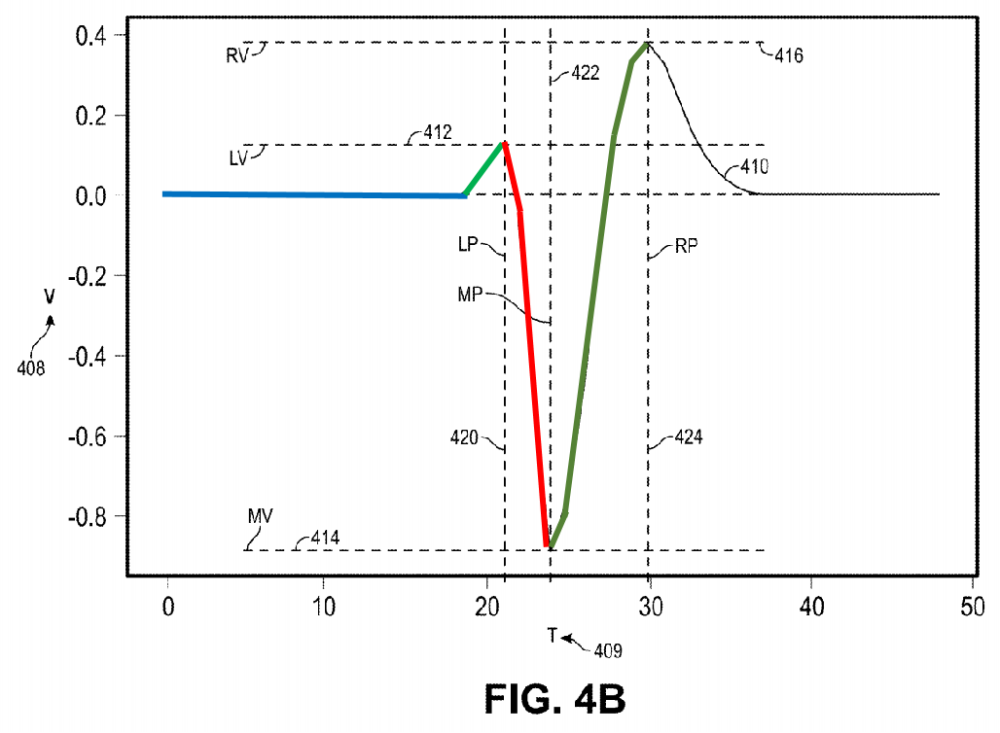

### Find local maxima and minima in filtered signal for each time window:

 Use the **time window length (blackout period)** set in the very beginning:

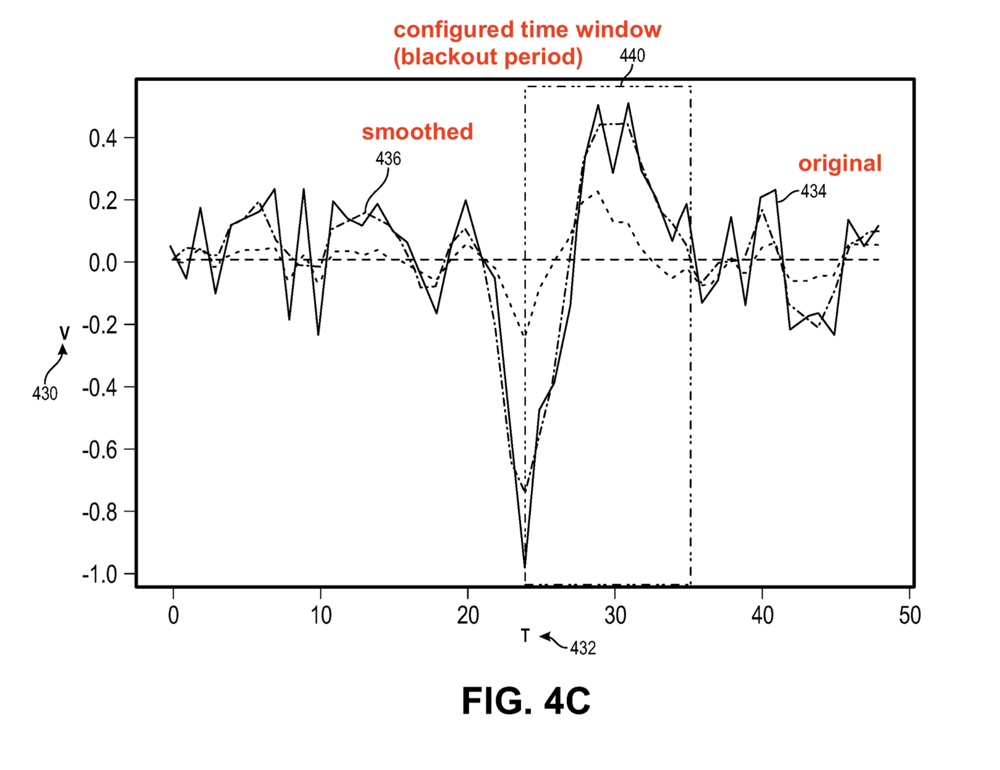

In [380]:
# Post-processing: For any consecutive [min, min, min, ...] or [max, max, max, ...] pattern, ONLY keep the most extreme extremum!
def post_processing(local_extrema):
    index = 0
    while index < len(local_extrema) - 1:

        # Find the next extrema with high value    
        vals = []
        j = index + 1
        while j < len(local_extrema) and local_extrema[j][1] == local_extrema[index][1]:
            vals.append(y[int(local_extrema[j][0])])
            j += 1

        #             i   j=i+1     i   j=i+1
        # If indeed [min, max]  or [max, min], skip
        if j == index + 1:
            index = j
            continue

        # Otherwise, keep only the most extreme extremum
        else:
            type_ = local_extrema[index][1]
            assert(type_ == local_extrema[j - 1][1])
            if type_ == 'min':
                offset = np.argmin(vals)
                local_extrema[index : j] = local_extrema[index + offset]
            else:
                offset = np.argmax(vals)
                local_extrema[index : j] = local_extrema[index + offset]

        index = j   
    
    # Remove all repeated values (keep only 1 of them)
    local_extrema_unique = []
    index = 0 
    
    while index < len(local_extrema):
        j = index + 1 
        
        while j < len(local_extrema) and local_extrema[j][0] == local_extrema[index][0]:
            j += 1
        
        local_extrema_unique.append(tuple(local_extrema[index]))
        index = j
    
    return local_extrema_unique

In [381]:
# Get the indices for each window of length `blackout_period`
def get_local_extrema(blackout_period = 0.04):
    index = 0
    
    local_extrema = []
    
    # Convert window time to indices
    blackout_period_in_indices = time_to_index(blackout_period)
    
    while index < len(y) - blackout_period_in_indices:
        i1 = index
        i2 = min(len(y), index + blackout_period_in_indices)
        
        # Find all peaks within time window 
        all_local_min_within_window = index + find_peaks(-y[i1 : i2])[0]
        all_local_max_within_window = index + find_peaks(y[i1 : i2])[0]
        
        local_min = index + np.argmin(y[i1 : i2])
        local_max = index + np.argmax(y[i1 : i2])
        
        if local_min in all_local_min_within_window:
            local_extrema.append((int(local_min), 'min'))
        
        if local_max in all_local_max_within_window:
            local_extrema.append((int(local_max), 'max'))
        
        # Move to next window
        index += 1
    
    # Sort the local extrema
    local_extrema.sort()
    
    # Perform post-processing on local_extrema
    local_extrema = np.array(local_extrema)
    local_extrema = post_processing(local_extrema)
    
    # Add the local min and max accordingly
    local_minima = []
    local_maxima = []
    for tup in local_extrema:
        if tup[1] == 'min':
            local_minima.append(int(tup[0]))
        else:
            local_maxima.append(int(tup[0]))
    
    return local_minima, local_maxima

In [382]:
# Get the local extrema (min and max) per window
local_minima, local_maxima = get_local_extrema(blackout_period = blackout_period) 

In [383]:
# Post-processing: remove first local extrema if it's a minima (we don't need it!)
if local_minima[0] < local_maxima[0]:
    local_minima = local_minima[1:]

<Figure size 432x288 with 0 Axes>

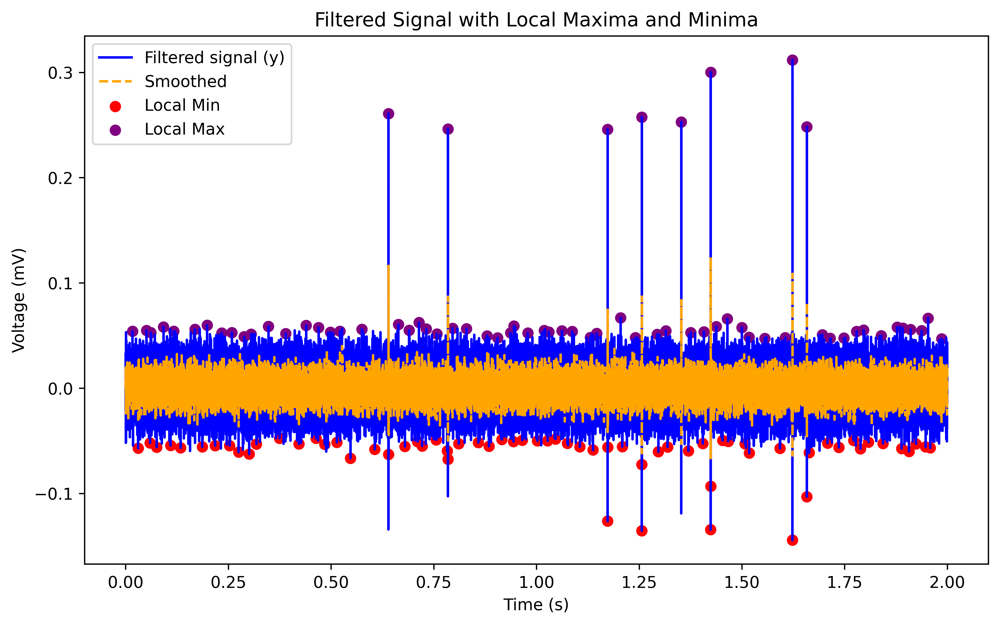

In [384]:
plt.figure()
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 600)
plt.subplots_adjust(hspace=0.4)

# Plot filtered signal (for determining thresholds)
plt.plot(t, y, color='blue', linestyle='-', label='Filtered signal (y)')
plt.plot(t, forecast, color='orange', linestyle='--', label='Smoothed')
plt.scatter(t[local_minima], y[local_minima], color='red', label='Local Min')
plt.scatter(t[local_maxima], y[local_maxima], color='purple', label='Local Max')

plt.title("Filtered Signal with Local Maxima and Minima")
plt.xlabel("Time (s)")
plt.ylabel("Voltage (mV)")
plt.legend()
# plt.xlim(0, 5)

plt.show()

### Identify fit values

In [385]:
# Determine the fit values between a signal 
# idx: index of local max/min
def fit_values(local_minima, local_maxima, idx):
    
    # Get left, middle, right timestamps
    lp = t[local_maxima[idx]]
    mp = t[local_minima[idx]]
    rp = t[local_maxima[idx + 1]] # aka end time of window

    # Get left, middle, right voltages
    lv = y[local_maxima[idx]]
    mv = y[local_minima[idx]]
    rv = y[local_maxima[idx + 1]]
    
    return lp, mp, rp, lv, mv, rv

## 5. Compute Characteristic Values

The **mean absolute deviation (MAD) estimation** function is given as:

$\hat{m} = m + \alpha(|x| - m)$, 

where $m$ is the mean value across the **smoothed** signal in a given time window, $alpha$ is a **user-configured parameter** for the update multiplier (set as **0.0002**), and $|x|$ is the **value of the original signal**. 

Note that we are taking the MAD **for each time window $[t_{1}, t_{2}]$**, which entails **accumulating the absolute deviation of the signal ($m + \alpha(|x| - m)$)** to the **smoothed function** within the time window, and then **dividing it by the magnitude of the negative deflection**. So the actual formula is as follows:

$\hat{m} = \frac{ \sum_{t=t_{1}}^{t_2}{m + \alpha(|x_{t}| - m)}}{\sum_{t=t_{1}}^{t_{2}}{|x_{t}| - m}}$, where $m$ is the mean of the **smoothed** signal calculated **over $t_{1}$ and $t_{2}$**. 

The **threshold** $thres$ is given as:

$thres = \beta * m$, where $\beta$ is a **scale factor constant** given in the **range from 0 to 7.875** (given in **Q3.3 format - 3 bits for integer, 3 bits for fraction**; must be a **multiple of 0.125**)

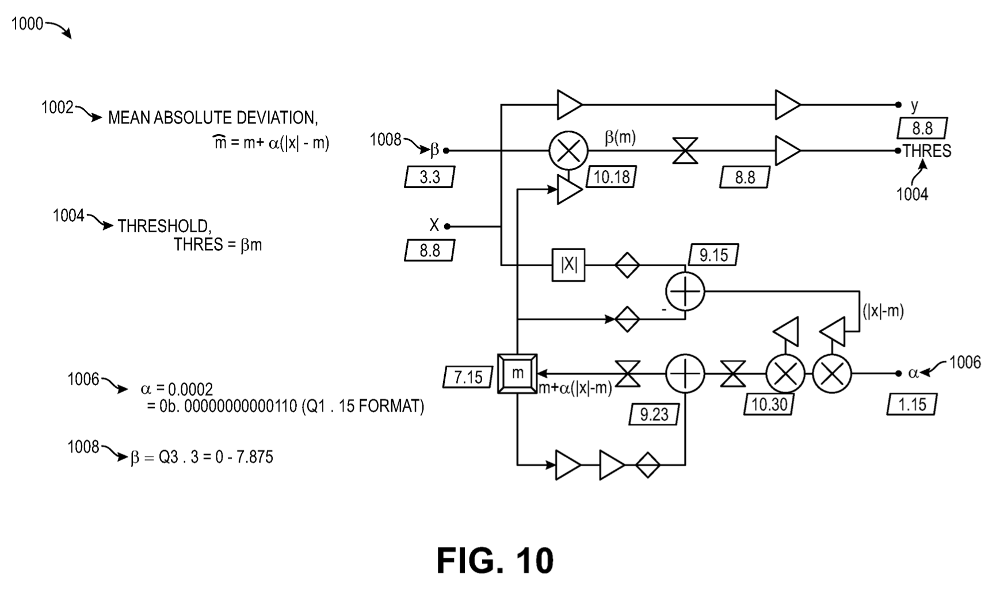

In [386]:
# Calculate the mean absolute deviation (MAD) of a signal
# MAD = sum(m + alpha * (|x| - m)) / sum(|x| - m), 
# where m is the mean of the smoothed signal over a time period, and x is an original signal value
# alpha - user-configurable multiplicative constant, a small number (0.0002)
def mean_absolute_deviation(smoothed_data, original_data, i1, i2, alpha):
    mean = np.mean(smoothed_data[i1:i2])
    dev = np.abs(original_data[i1:i2]) - mean
    negative_deflection = np.sum(dev)
    mad = np.abs(np.sum(mean + alpha * dev) / negative_deflection)
    return mad

In [387]:
# Calculate the threshold 
# thres = beta * m, where m is the mean of the signal over a time period
def calulate_threshold(smoothed_signal, i1, i2, beta):
    return beta * np.mean(smoothed_signal[i1:i2])

The **characteristic values** (in a **configured time window**) are shown as:

$ldist = mp - lp$ (time elapsed between first local maximum and local minimum)

$rdist = rp - mp$ (time elapsed between local minimum and second local maximum)

$ratio = \frac{rv}{|mv|}$ (relative voltage ratio of second local maximum and local minimum voltage magnitude)

$asym = \frac{lv}{rv}$ (meausre of asymmetric property - $asym = 1$ means the left & right local maxima are symmetric)

$cost = \frac{esterr}{|mv|}$ (ratio between second local maximum voltage and local minimum voltage magnitude)

where $lp, mp, rp$ are the **left, middle, and right timestamps** and $lv, mv, rv$ are the **left, middle, and right voltage values (shown in Fig. 4B above)**. 

$esterr$ is given as the **mean absolute deviation (MAD) estimate**.  

We sample **$[lp, rp]$** as our **time window**. 

In [388]:
# Get characteristic values on the intervals i1, i2, based on previously computed fit values (lp, mp, rp, lv, mv, rv)
# alpha: hyperparam for MAD calculation
# beta: hyperparam for threshold calculation
def characteristic_values(lp, mp, rp, lv, mv, rv, i1, i2, alpha, beta):
    # Compute characteristic values
    ldist = mp - lp
    rdist = rp - mp
    ratio = rv / abs(mv)
    asym = lv / rv
    esterr = mean_absolute_deviation(forecast, x, i1, i2, alpha) # esterr - MAD of signal within time window
    cost = esterr / abs(mv)
    
    # Compute threshold
    thres = calulate_threshold(forecast, i1, i2, beta)
    
    return ldist, rdist, ratio, asym, esterr, cost, thres

## 6. Determining Thresholds

These following cells in this section will help you determine the optimal thresholds. 

In [389]:
# Set alpha (for MAD calculation) and beta (for threshold calculation) as follows:
alpha = 0.0002
beta = 3.75

In [390]:
def plot_characteristic(local_minima, local_maxima, characteristic, alpha, beta):
    output = []
    times = []
    spike_times = []
    spike_output = []
    
    i_pointer = 0
    
    MIN_WINDOW_BOUND_TOLERANCE_TIME = 0.0001 
    
    plt.figure(figsize=(10, 6))
    
    for idx in np.arange(0, len(local_maxima) - 1):
        if idx < len(local_minima): # bounds check        
            # Compute fit values
            lp, mp, rp, lv, mv, rv = fit_values(local_minima, local_maxima, idx)
            
            # Compute characteristic values
            ldist, rdist, ratio, asym, esterr, cost, thres = characteristic_values(lp, mp, rp, lv, mv, rv, local_maxima[idx], local_maxima[idx + 1], alpha, beta)
        
            # Check if in range
            spike_in_range = (i_pointer < len(sampled_spike_indices)) and (t[sampled_spike_indices][i_pointer] >= lp or np.abs(t[sampled_spike_indices][i_pointer] - lp) <= MIN_WINDOW_BOUND_TOLERANCE_TIME) and (t[sampled_spike_indices][i_pointer] <= rp or np.abs(t[sampled_spike_indices][i_pointer] - rp) <= MIN_WINDOW_BOUND_TOLERANCE_TIME)
            
            if characteristic == 'asym':
                output.append(asym)
                times.append(lp)
                if spike_in_range > 0:
                    spike_times.append(lp)
                    spike_output.append(asym)
                    i_pointer += 1
            elif characteristic == 'ratio':
                output.append(ratio)
                times.append(rp)
                if spike_in_range:
                    spike_times.append(rp)
                    spike_output.append(ratio)
                    i_pointer += 1
            elif characteristic == 'cost':
                output.append(cost)
                times.append(rp)
                if spike_in_range:
                    spike_times.append(rp)
                    spike_output.append(cost)
                    i_pointer += 1
            elif characteristic == 'thres':
                output.append(thres)
                times.append(mp)
                if spike_in_range:
                    spike_times.append(mp)
                    spike_output.append(thres)
                    i_pointer += 1
            elif characteristic == 'ldist':
                output.append(ldist)
                times.append(mp)
                if spike_in_range:
                    spike_times.append(mp)
                    spike_output.append(ldist)
                    i_pointer += 1
            elif characteristic == 'rdist':
                output.append(rdist)
                times.append(mp)
                if spike_in_range:
                    spike_times.append(mp)
                    spike_output.append(rdist)
                    i_pointer += 1
            elif characteristic == 'lv':
                output.append(lv)
                times.append(lp)
                if spike_in_range:
                    spike_times.append(lp)
                    spike_output.append(lv)
                    i_pointer += 1
            elif characteristic == 'rv':
                output.append(rv)
                times.append(rp)
                if spike_in_range:
                    spike_times.append(rp)
                    spike_output.append(rv)
                    i_pointer += 1
            elif characteristic == 'mv':
                output.append(mv)
                times.append(mp)
                if spike_in_range:
                    spike_times.append(mp)
                    spike_output.append(mv)
                    i_pointer += 1
    
    plt.plot(times, output)
    plt.xlabel('Time (s)')
    plt.ylabel(characteristic)
    plt.scatter(t[sampled_spike_indices], 0.00004 + np.zeros(sampled_spike_indices.shape), color='r')
    plt.show()
    
    return np.array(spike_times), np.array(times), np.array(spike_output), np.array(output)

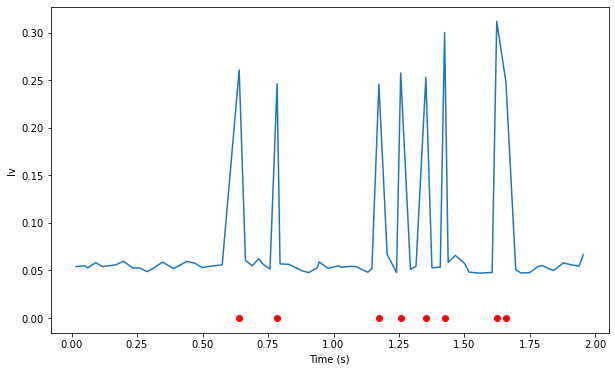

times where spikes detected: [0.5751  0.7575  1.14655 1.24075 1.315   1.4076  1.6056  1.6231 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
lv of spikes: [0.05590816 0.05148226 0.05203218 0.0479266  0.0544258  0.05352211
 0.04789255 0.31179561]
max lv of spikes: 0.3117956100987509


In [391]:
# Plot lv
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='lv', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('lv of spikes:', spike_output)
print('max lv of spikes:', np.max(spike_output))

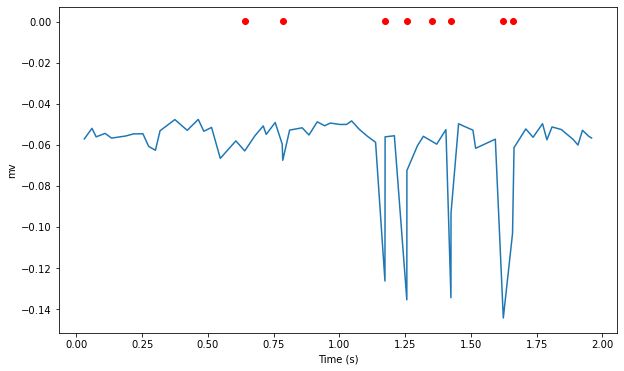

times where spikes detected: [0.60645 0.78265 1.17315 1.2563  1.3192  1.42395 1.623   1.6581 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
mv of spikes: [-0.05811802 -0.05968559 -0.12634783 -0.1355227  -0.05588134 -0.13450315
 -0.14435183 -0.10320108]
min mv of spikes: -0.1443518324787848


In [392]:
# Plot mv
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='mv', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('mv of spikes:', spike_output)
print('min mv of spikes:', np.min(spike_output))

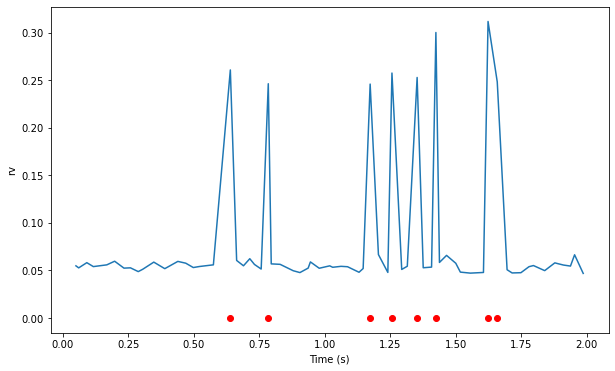

times where spikes detected: [0.6398  0.7846  1.17325 1.25645 1.3525  1.4241  1.6231  1.6582 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
rv of spikes: [0.26082341 0.24632228 0.24595972 0.25756675 0.25289899 0.30019181
 0.31179561 0.24829197]
min rv of spikes: 0.24595971646140039


In [393]:
# Plot rv
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='rv', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('rv of spikes:', spike_output)
print('min rv of spikes:', np.min(spike_output))

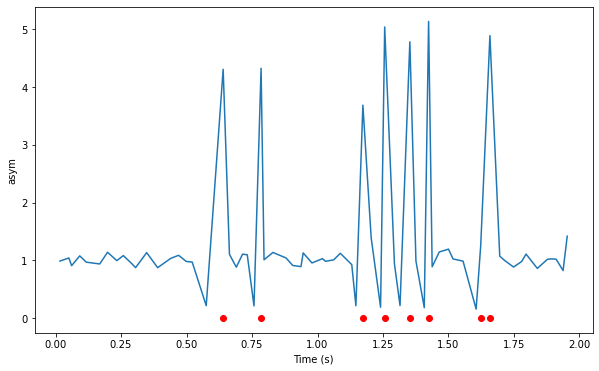

times where spikes detected: [0.5751  0.7575  1.14655 1.24075 1.315   1.4076  1.6056  1.6231 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
asym of spikes: [0.21435254 0.20900366 0.21154759 0.18607447 0.21520768 0.17829305
 0.15360238 1.25576194]
max asym of spikes: 1.2557619409853236


In [394]:
# Plot asym per lp
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='asym', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('asym of spikes:', spike_output)
print('max asym of spikes:', np.max(spike_output))

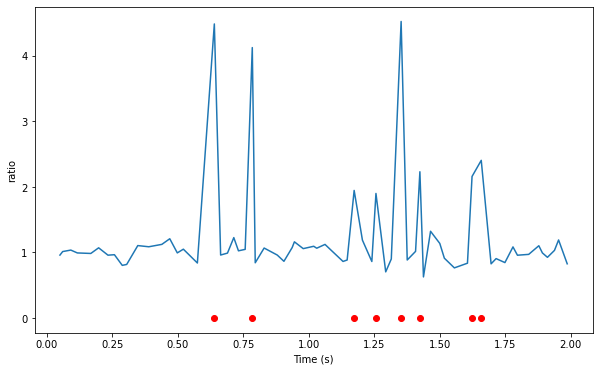

times where spikes detected: [0.6398  0.7846  1.17325 1.25645 1.3525  1.4241  1.6231  1.6582 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
ratio of spikes: [4.48782371 4.12699722 1.94668731 1.90054322 4.52564329 2.23185712
 2.15996988 2.40590468]
min ratio of spikes: 1.9005432245178404


In [395]:
# Plot ratio per rp
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='ratio', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('ratio of spikes:', spike_output)
print('min ratio of spikes:', np.min(spike_output[spike_output > 0]))

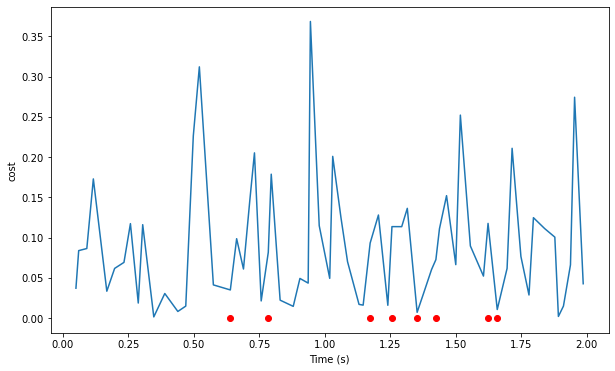

times where spikes detected: [0.6398  0.7846  1.17325 1.25645 1.3525  1.4241  1.6231  1.6582 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
cost of spikes: [0.03488485 0.08166569 0.09316939 0.11360026 0.00705775 0.07258489
 0.11760445 0.01054436]
max cost of spikes: 0.11760444842733053


In [396]:
# Plot cost per rp
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='cost', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('cost of spikes:', spike_output)
print('max cost of spikes:', np.max(spike_output))

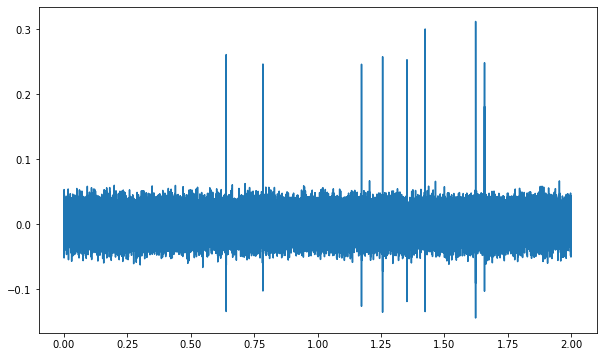

In [397]:
plt.figure(figsize=(10, 6))
plt.plot(t, y)
plt.show()

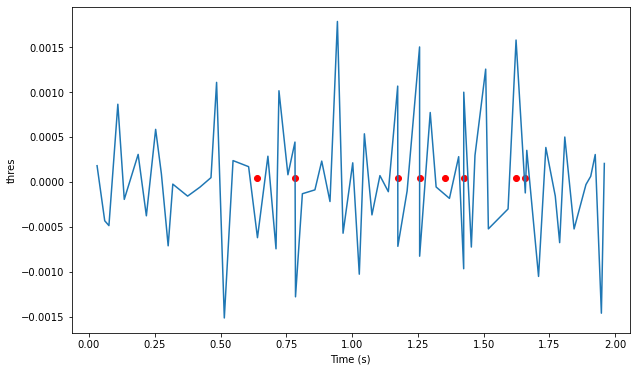

times where spikes detected: [0.60645 0.78265 1.17315 1.2563  1.3192  1.42395 1.623   1.6581 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
thres of spikes: [ 1.68797277e-04  4.42570081e-04  1.06569933e-03  1.50154762e-03
 -5.73718466e-05 -9.67388059e-04  1.57836788e-03 -1.23497760e-04]
min thres of spikes: -0.0009673880591255193
max thres of spikes: 0.0015783678839962946


In [398]:
# Plot thres 
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='thres', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('thres of spikes:', spike_output)
print('min thres of spikes:', np.min(spike_output))
print('max thres of spikes:', np.max(spike_output))

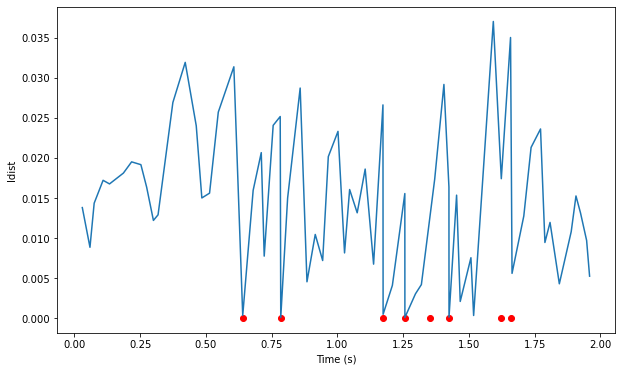

times where spikes detected: [0.60645 0.78265 1.17315 1.2563  1.3192  1.42395 1.623   1.6581 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
ldist of spikes: [0.03135 0.02515 0.0266  0.01555 0.0042  0.01635 0.0174  0.035  ]
max ldist of spikes: 0.03500000000000014


In [399]:
# Plot ldist 
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='ldist', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('ldist of spikes:', spike_output)
print('max ldist of spikes:', np.max(spike_output))

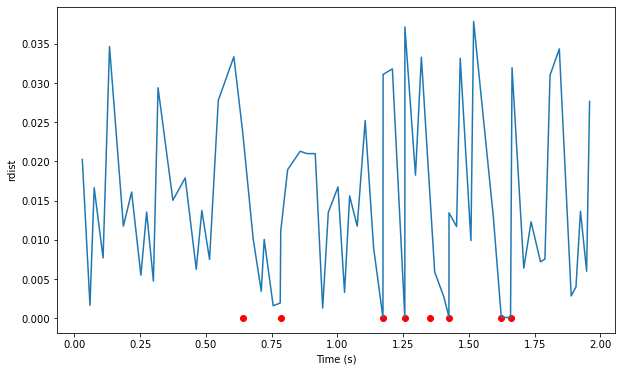

times where spikes detected: [0.60645 0.78265 1.17315 1.2563  1.3192  1.42395 1.623   1.6581 ]
times where spikes sampled: [0.6398  0.7846  1.1732  1.25645 1.3525  1.4241  1.6231  1.6582 ]
rdist of spikes: [3.335e-02 1.950e-03 1.000e-04 1.500e-04 3.330e-02 1.500e-04 1.000e-04
 1.000e-04]
min rdist of spikes: 9.999999999998899e-05
max rdist of spikes: 0.03334999999999999


In [400]:
# Plot rdist 
spike_times, times, spike_output, output = plot_characteristic(local_minima, local_maxima, characteristic='rdist', alpha=alpha, beta=beta)
print('times where spikes detected:', spike_times) 
print('times where spikes sampled:', t[sampled_spike_indices])
print('rdist of spikes:', spike_output)
print('min rdist of spikes:', np.min(spike_output))
print('max rdist of spikes:', np.max(spike_output))

Based on the above trials, $\alpha$, $\beta$ params, as well as more manual tuning, I set the thresholds to the following:

In [401]:
# Set threshold values here
MIN_RATIO = 1.33
MAX_ASYM = 1
MAX_COST = 2
MIN_THRES = -0.5
MAX_THRES = 0.1
# MIN_LDIST = 5e-5
MAX_LDIST = 0.2
MIN_RDIST = 5e-5
MAX_RDIST = 0.2

## 7. Determine Whether Comparison indicates Spike + Timestamp of detection

The overall algorithm for determining spikes is listed below:

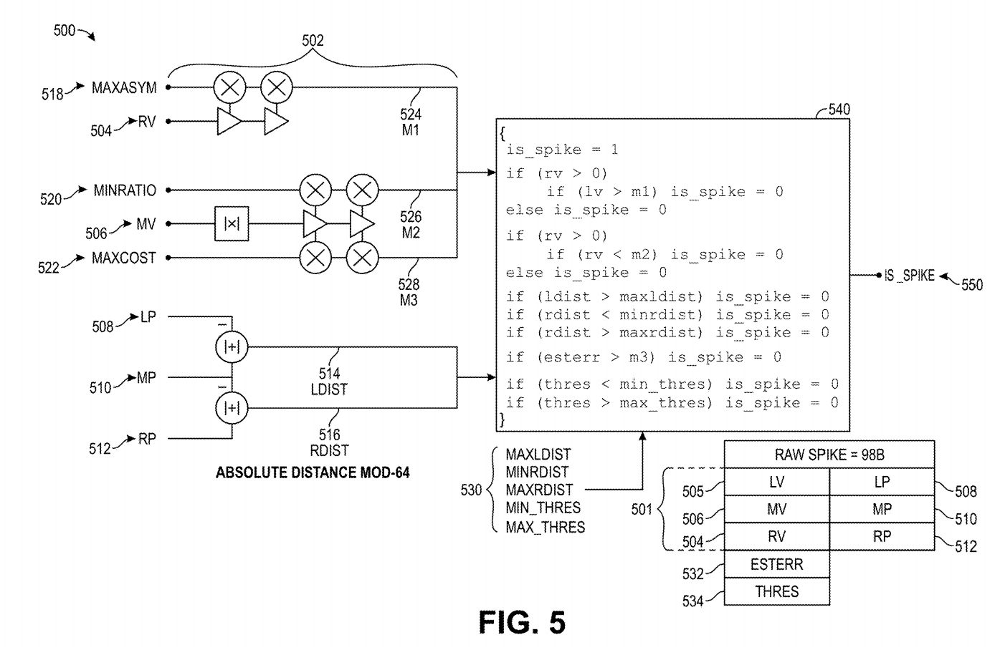

In [402]:
# Compare characteristic values with threshold
# idx: index of the local maxima/minima
def is_spike(idx, alpha=0.0002, beta=3.75, MAX_ASYM=0.3, MIN_RATIO=4/3, MAX_COST=0.4, MIN_THRES=0.2, MAX_THRES=0.7, MAX_LDIST=0.02, MIN_RDIST=0.0001, MAX_RDIST=0.02):
    # assert beta in [0, 7.875] range (Q3.3)
    assert(beta >= 0 and beta <= 7.875)
    
    # Compute fit values
    lp, mp, rp, lv, mv, rv = fit_values(local_minima, local_maxima, idx)
    
    # Compute characteristic values
    ldist, rdist, ratio, asym, esterr, cost, thres = characteristic_values(lp, mp, rp, lv, mv, rv, local_maxima[idx], local_maxima[idx + 1], alpha, beta)
    
    m1 = rv * MAX_ASYM # compare with lv
    m2 = abs(mv) * MIN_RATIO # compare with rv
    m3 = abs(mv) * MAX_COST # compare with esterr
    
    # Determine whether signal represents a spike 
    # spike: rv MUST be positive!!
    if rv > 0: 
        if lv > m1:
            return 0
        if rv < m2:
            return 0
    else:
        return 0

    if thres < MIN_THRES:
        return 0
    
    if thres > MAX_THRES:
        return 0
    
    if ldist > MAX_LDIST: 
        return 0
    
    if rdist < MIN_RDIST:
        return 0
    
    if rdist > MAX_RDIST:
        return 0
    
    if esterr > m3:
        return 0
    
    spike_payload = {
        'lp': lp,
        'mp': mp,
        'rp': rp,
        'lv': lv,
        'mv': mv,
        'rv': rv,
        'ldist': ldist,
        'rdist': rdist,
        'ratio': ratio,
        'asym': asym,
        'cost': cost,
        'thres': thres
    }
    
    return (1, spike_payload)

In [403]:
# Sample each window (based on the local max-min-max values)
idx = 0
spikes = []

while idx < len(local_maxima) - 1:
    if idx < len(local_minima): # bounds check       
        assert(local_maxima[idx] < local_minima[idx])
        assert(local_minima[idx] < local_maxima[idx + 1])
        
        # Determine whether a spike is detected
        spike = is_spike(idx, alpha=alpha, beta=beta, MAX_ASYM=MAX_ASYM, MIN_RATIO=MIN_RATIO, MAX_COST=MAX_COST, MIN_THRES=MIN_THRES, MAX_THRES=MAX_THRES, MAX_LDIST=MAX_LDIST, MIN_RDIST=MIN_RDIST, MAX_RDIST=MAX_RDIST)
        
        if spike:
            spikes.append(spike)
            idx += 2
            continue
            
        idx += 1

## 8. Transmit Indication of Spike (if detected)

- Transmit **timestamp** of corresponding spike and **value "1"** that spike was identified
- Can be transmitted via wired or wireless connection

In [425]:
spikes

[(1,
  {'lp': 0.5751000000000001,
   'mp': 0.60645,
   'rp': 0.6398,
   'lv': 0.05590816015817584,
   'mv': -0.05811801651678744,
   'rv': 0.2608234122544128,
   'ldist': 0.03134999999999999,
   'rdist': 0.03334999999999999,
   'ratio': 4.4878237057363055,
   'asym': 0.21435253712439667,
   'cost': 0.03488484694495756,
   'thres': 0.00016879727693843805}),
 (1,
  {'lp': 0.7575000000000001,
   'mp': 0.7826500000000001,
   'rp': 0.7846000000000001,
   'lv': 0.0514822597080611,
   'mv': -0.05968559468861567,
   'rv': 0.24632228363706676,
   'ldist': 0.025150000000000006,
   'rdist': 0.0019500000000000073,
   'ratio': 4.12699722474324,
   'asym': 0.20900366360647854,
   'cost': 0.08166569239303755,
   'thres': 0.0004425700811701358}),
 (1,
  {'lp': 1.14655,
   'mp': 1.1731500000000001,
   'rp': 1.1732500000000001,
   'lv': 0.052032184959506955,
   'mv': -0.12634782963599242,
   'rv': 0.24595971646140039,
   'ldist': 0.02660000000000018,
   'rdist': 9.999999999998899e-05,
   'ratio': 1.9466

In [404]:
def get_spikes_df(spikes):
    spike_payloads = [spike[1] for spike in spikes]
    df = pd.DataFrame(spike_payloads)
    return df

In [405]:
df = get_spikes_df(spikes)
df

,lp,mp,rp,lv,mv,rv,ldist,rdist,ratio,asym,cost,thres
0,0.57510,0.60645,0.63980,0.055908,-0.058118,0.260823,0.03135,0.03335,4.487824,0.214353,0.034885,0.000169
1,0.75750,0.78265,0.78460,0.051482,-0.059686,0.246322,0.02515,0.00195,4.126997,0.209004,0.081666,0.000443
2,1.14655,1.17315,1.17325,0.052032,-0.126348,0.245960,0.02660,0.00010,1.946687,0.211548,0.093169,0.001066
3,1.24075,1.25630,1.25645,0.047927,-0.135523,0.257567,0.01555,0.00015,1.900543,0.186074,0.113600,0.001502
4,1.31500,1.31920,1.35250,0.054426,-0.055881,0.252899,0.00420,0.03330,4.525643,0.215208,0.007058,-0.000057
5,1.40760,1.42395,1.42410,0.053522,-0.134503,0.300192,0.01635,0.00015,2.231857,0.178293,0.072585,-0.000967
6,1.60560,1.62300,1.62310,0.047893,-0.144352,0.311796,0.01740,0.00010,2.159970,0.153602,0.117604,0.001578


In [406]:
bitstream = ''
for val in df['rp']:
    bitstream += '1 ' + str(val) + ', '
print('bitstream to transmit:', bitstream)

bitstream to transmit: 1 0.6398, 1 0.7846000000000001, 1 1.1732500000000001, 1 1.25645, 1 1.3525, 1 1.4241000000000001, 1 1.6231, 


### Plot the spikes graph (just for comparison)

<Figure size 432x288 with 0 Axes>

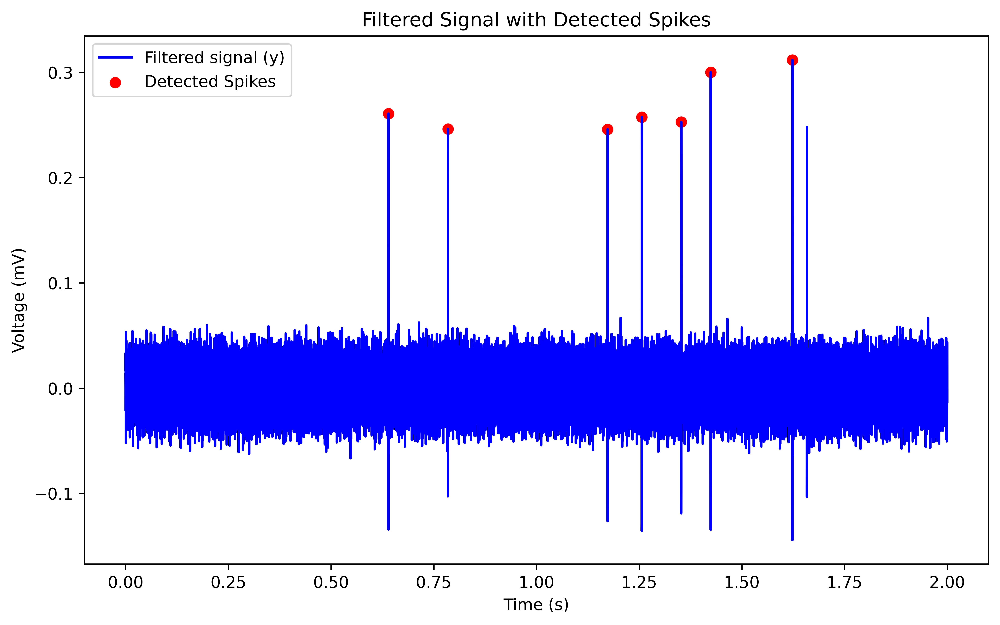

In [407]:
plt.figure()
fig, ax = plt.subplots(1, 1, figsize=(10, 6), dpi = 600)
plt.subplots_adjust(hspace=0.4)

# Plot signals for spikes 
plt.plot(t, y, color='blue', linestyle='-', label='Filtered signal (y)', zorder=1)
plt.scatter(df['rp'], df['rv'], color='red', label='Detected Spikes')

plt.title("Filtered Signal with Detected Spikes")
plt.xlabel("Time (s)")
plt.ylabel("Voltage (mV)")
plt.legend()

plt.show()

For the most part, we can see the **spikes are detected correctly**. For spikes that are relatively close to each other, only one of them is detected. Every spike that is spread out is detected. 

Note that **if the local maximum in the first time window happens to be a spike, it is ignored**, as normally it would be **detected in a previous window before time 0** (since neural signals are sampled in ***real-time***). 

## Additional: Classify Spikes into Bins

In practice, there are **billions** of neural signals / spikes being sampled at the same time, so much more sophisticated plots are needed. But here, since we do not deal with a lot of spikes, we can just simply plot a histogram for each of them. 

For example, we can **give each bin a value (0, 1, 2, 3, ....)**, and transmit it along with a **timestamp of when the spike is detected (`rp`)**. 

Classification of spikes is advantageous, as **two spikes** with **two different values** could indicate **two different actions** (e.g., one neuron means **moving a hand up**, another neuron means **moving a hand down**). 

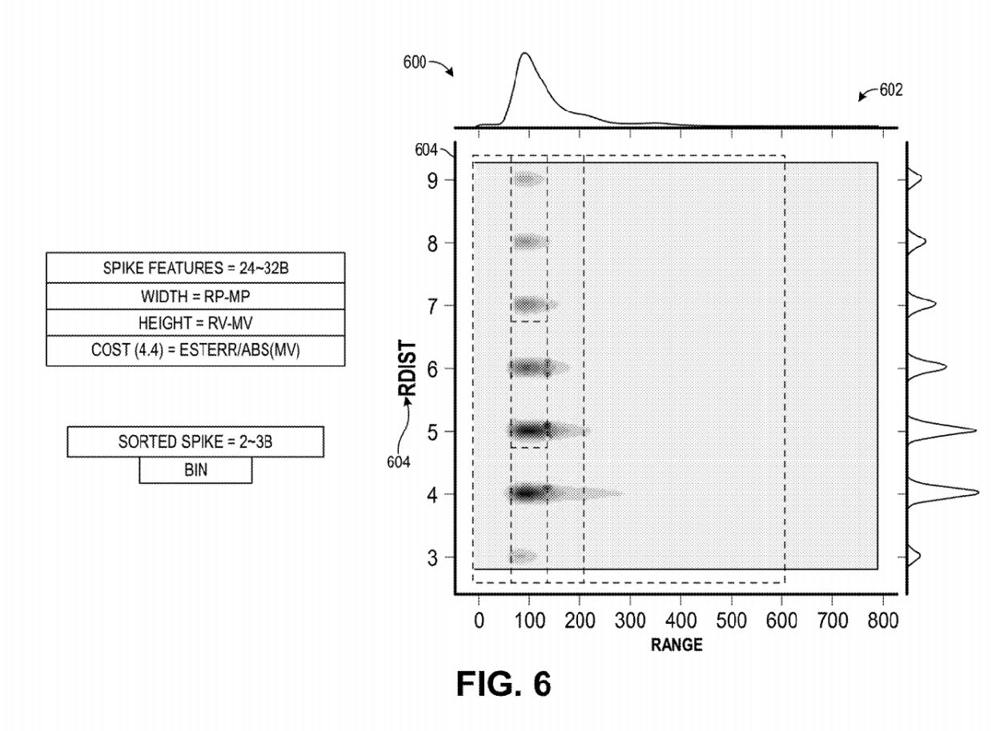

In [408]:
# Define a function to calculate histogram plot
def calculate_histogram(data, bins):
    hist, bin_edges = np.histogram(data, bins=bins)
    return hist, bin_edges
 
# Classify each point into bins
def classify_points(data, hist, bin_edges):
    # Initialization: zeros
    classification = np.zeros(len(data), dtype=int)
    
    # Iterate each point, then find the range and then its corresponding bin classification
    for i, point in enumerate(data):
        for j, (lower_bound, upper_bound) in enumerate(zip(bin_edges, bin_edges[1:])):
            if lower_bound <= point <= upper_bound:
                classification[i] = j
                break
    return classification

In [409]:
# New dataframe - for binning
df2 = pd.DataFrame(df['rp'])
df2.rename(columns={'rp': 'timestamp of spike (s)'}, inplace=True)

In [410]:
# Set # of bins here
n_bins = 6

### Time between min & max voltage (rdist)

In [411]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['rdist'], bins=n_bins)
 
# Classify points
classification = classify_points(df['rdist'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,5
1,0.78460,0
2,1.17325,0
3,1.25645,0
4,1.35250,5
5,1.42410,0
6,1.62310,0


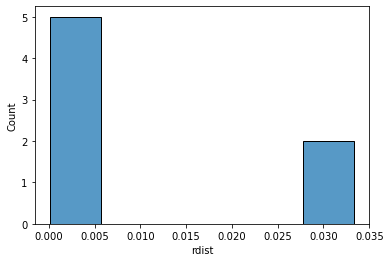

In [412]:
# Plot histogram
sns.histplot(df['rdist'], bins=n_bins)
plt.show()

### Time between last max and min voltage (ldist)

In [413]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['ldist'], bins=n_bins)
 
# Classify points
classification = classify_points(df['ldist'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,5
1,0.78460,4
2,1.17325,4
3,1.25645,2
4,1.35250,0
5,1.42410,2
6,1.62310,2


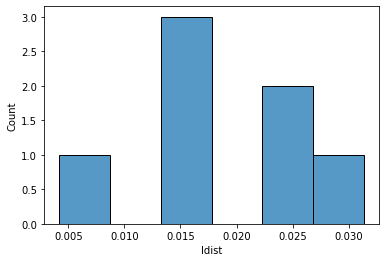

In [414]:
# Plot histogram
sns.histplot(df['ldist'], bins=n_bins)
plt.show()

### Maximum voltage values (rv)

In [415]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['rv'], bins=n_bins)
 
# Classify points
classification = classify_points(df['rv'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,1
1,0.78460,0
2,1.17325,0
3,1.25645,1
4,1.35250,0
5,1.42410,4
6,1.62310,5


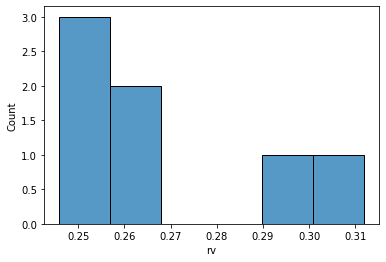

In [416]:
# Plot histogram
sns.histplot(df['rv'], bins=n_bins)
plt.show()

### Magnitude of left hump (lv)

In [417]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['lv'], bins=n_bins)
 
# Classify points
classification = classify_points(df['lv'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,5
1,0.78460,2
2,1.17325,3
3,1.25645,0
4,1.35250,4
5,1.42410,4
6,1.62310,0


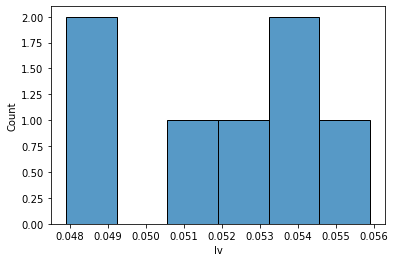

In [418]:
# Plot histogram
sns.histplot(df['lv'], bins=n_bins)
plt.show()

### Relative magnitude of left and right voltages (asym)

In [419]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['asym'], bins=n_bins)
 
# Classify points
classification = classify_points(df['asym'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,5
1,0.78460,5
2,1.17325,5
3,1.25645,3
4,1.35250,5
5,1.42410,2
6,1.62310,0


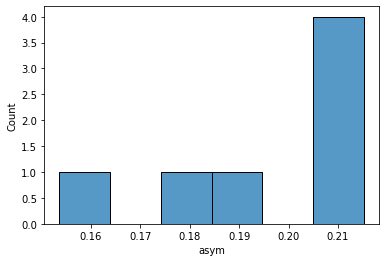

In [420]:
# Plot histogram
sns.histplot(df['asym'], bins=n_bins)
plt.show()

### Relative (absolute) magnitude between right and middle voltages (ratio)

In [421]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['ratio'], bins=n_bins)
 
# Classify points
classification = classify_points(df['ratio'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,5
1,0.78460,5
2,1.17325,0
3,1.25645,0
4,1.35250,5
5,1.42410,0
6,1.62310,0


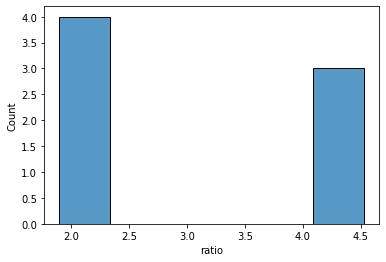

In [422]:
# Plot histogram
sns.histplot(df['ratio'], bins=n_bins)
plt.show()

### Ratio of estimated MAD to absolute value of second amplitude (cost)

In [423]:
# Calculate histogram
hist, bin_edges = calculate_histogram(df['cost'], bins=n_bins)
 
# Classify points
classification = classify_points(df['cost'], hist, bin_edges)
 
# Print result
df2['bin'] = classification
df2

,timestamp of spike (s),bin
0,0.63980,1
1,0.78460,4
2,1.17325,4
3,1.25645,5
4,1.35250,0
5,1.42410,3
6,1.62310,5


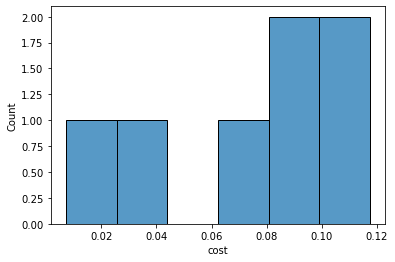

In [424]:
# Plot histogram
sns.histplot(df['cost'], bins=n_bins)
plt.show()

## Advantages of this system

- **Significant reduction in size** of signal (while **keeping useful information**)

- **Reduce received waveforms** by **3 orders of magnitude** for **low-power wireless transmission** (for 1000 channels, reduction from *gigabits* per second to *megabits* per second)

- Can be performed **much faster** with **lower memory & storage** requirements

- **Near real-time** detecion (approximately **1 microsecond** from receiving signal to spike detection)

- **Less power consumption** (1000 channels - consumes 1-2 milli-Watts per channel or less; 256 channels - under 50 milli-Watts, which is 10x more reduction than in prior systems)

## One Final PSA

As mentioned earlier above, this entire notebook is used for **demonstration and education purposes only**. The actual algorithm is **implemented in hardware**, since all variables here use **fixed-point computation**, as it **preserves resources while maintaining precision**. 

An example schematic of this implementation (showing MAD and threshold calculations) is shown here:

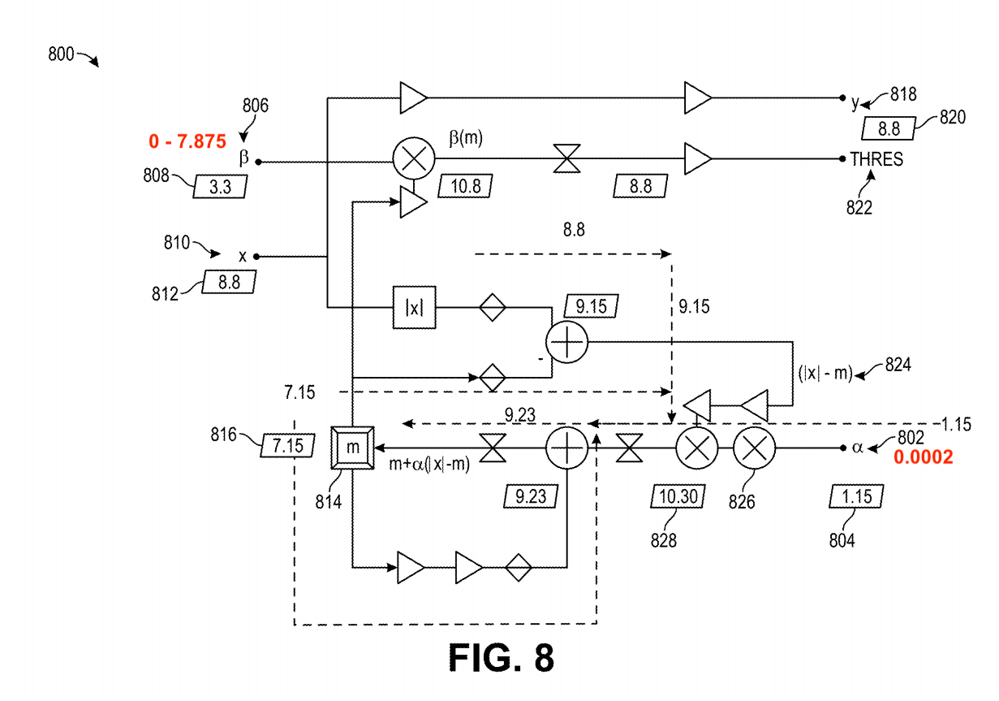